In [1]:
import os

In [2]:
DATA_ROOT = os.path.join(os.getcwd(),"data")
MODEL_ROOT = os.path.join(os.getcwd(),"models")

In [3]:
from helper_functions.utils import Market1501Dataset, PersonReIDDataset

In [4]:
dataset_PersonReID_path = os.path.join(DATA_ROOT,"IUSTPersonReID")
dataset_Market1501_path = os.path.join(DATA_ROOT,"Market-1501-v15.09.15")

In [5]:
dataset_PersonReID_train = PersonReIDDataset(os.path.join(dataset_PersonReID_path,"bounding_box_train"))
dataset_PersonReID_test = PersonReIDDataset(os.path.join(dataset_PersonReID_path,"bounding_box_test"))

In [6]:
print(f"Total images: {len(dataset_PersonReID_train)}")

for i in range(5):
    sample = dataset_PersonReID_train[i]
    print(f"[{i}] person_id={sample['person_id']}, "
          f"camera_id={sample['camera_id']}, "
          f"frame_id={sample['frame_id']}, "
          f"path={sample['image_path']}")


Total images: 69164
[0] person_id=1, camera_id=c2s1, frame_id=24962, path=c:\Users\jokub\Desktop\Tiriamasis projektas\Tiriamasis\data\IUSTPersonReID\bounding_box_train\0001_c2s1_024962_01.jpg
[1] person_id=1, camera_id=c2s1, frame_id=24968, path=c:\Users\jokub\Desktop\Tiriamasis projektas\Tiriamasis\data\IUSTPersonReID\bounding_box_train\0001_c2s1_024968_01.jpg
[2] person_id=1, camera_id=c2s1, frame_id=24974, path=c:\Users\jokub\Desktop\Tiriamasis projektas\Tiriamasis\data\IUSTPersonReID\bounding_box_train\0001_c2s1_024974_01.jpg
[3] person_id=1, camera_id=c2s1, frame_id=24980, path=c:\Users\jokub\Desktop\Tiriamasis projektas\Tiriamasis\data\IUSTPersonReID\bounding_box_train\0001_c2s1_024980_01.jpg
[4] person_id=1, camera_id=c2s1, frame_id=24986, path=c:\Users\jokub\Desktop\Tiriamasis projektas\Tiriamasis\data\IUSTPersonReID\bounding_box_train\0001_c2s1_024986_01.jpg


In [7]:
print(dataset_PersonReID_train[0])

{'image': tensor([[[ 0.1426,  0.0912,  0.0741,  ..., -0.5596, -0.5767, -0.5596],
         [ 0.1426,  0.0912,  0.0741,  ..., -0.5596, -0.5596, -0.5596],
         [ 0.1426,  0.0912,  0.0741,  ..., -0.5424, -0.5596, -0.5596],
         ...,
         [-0.0287, -0.2684, -0.4739,  ..., -1.5014, -1.5014, -1.4672],
         [-0.0972, -0.1486, -0.1999,  ..., -1.5185, -1.4843, -1.4672],
         [-0.3541, -0.6281, -0.3541,  ..., -1.5014, -1.4843, -1.4672]],

        [[ 0.2052,  0.2052,  0.2227,  ..., -0.4951, -0.4951, -0.5126],
         [ 0.1877,  0.2052,  0.2227,  ..., -0.5126, -0.5126, -0.5126],
         [ 0.1877,  0.2052,  0.2227,  ..., -0.4951, -0.5126, -0.5126],
         ...,
         [ 0.1527, -0.0749, -0.2850,  ..., -1.3179, -1.3179, -1.3004],
         [ 0.0651,  0.0476, -0.0049,  ..., -1.3354, -1.3004, -1.3004],
         [-0.1800, -0.4426, -0.1625,  ..., -1.3179, -1.3004, -1.3004]],

        [[ 0.2173,  0.1999,  0.1999,  ..., -0.4798, -0.4973, -0.4973],
         [ 0.1999,  0.1999,  0.1999

In [8]:
import random

all_sequences = [seq for person_data in dataset_PersonReID_train.sequences_by_person.values() for cam_data in person_data.values() for seq in cam_data]
print(len(all_sequences))
sampled_sequences = random.sample(all_sequences, 5)



2519


In [9]:
from ultralytics import YOLO
import cv2
model = YOLO(os.path.join(MODEL_ROOT,'yolo12l-person-seg-extended.pt'))

In [ ]:
from helper_functions.utils import get_person_masks_for_sequence
images_list = []
masks_list = []
combined_list = []
for i, sequence in enumerate(sampled_sequences):
    im, mas, com = get_person_masks_for_sequence(sequence, model)
    images_list.append(im)
    masks_list.append(mas)
    combined_list.append(com)



0: 640x640 2 items, 402.5ms
Speed: 7.3ms preprocess, 402.5ms inference, 39.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x448 1 item, 74.7ms
Speed: 1.7ms preprocess, 74.7ms inference, 9.5ms postprocess per image at shape (1, 3, 640, 448)

0: 640x384 1 item, 75.8ms
Speed: 1.9ms preprocess, 75.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x352 1 item, 73.0ms
Speed: 1.5ms preprocess, 73.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 352)

0: 640x384 1 item, 22.7ms
Speed: 1.9ms preprocess, 22.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x448 1 item, 23.7ms
Speed: 1.4ms preprocess, 23.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 item, 21.0ms
Speed: 2.0ms preprocess, 21.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x416 1 item, 74.5ms
Speed: 1.6ms preprocess, 74.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 416)

0: 

In [11]:
len(images_list[0])

19

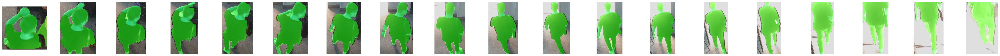

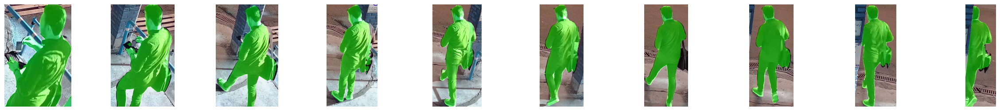

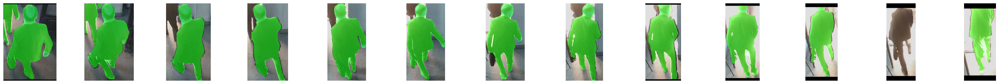

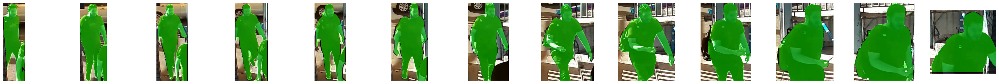

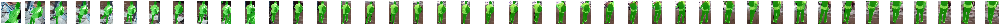

In [12]:
from helper_functions.utils import display_masks
display_masks(images_list,masks_list)

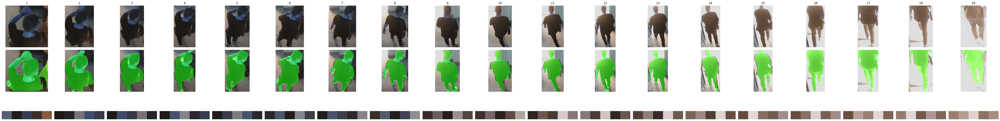

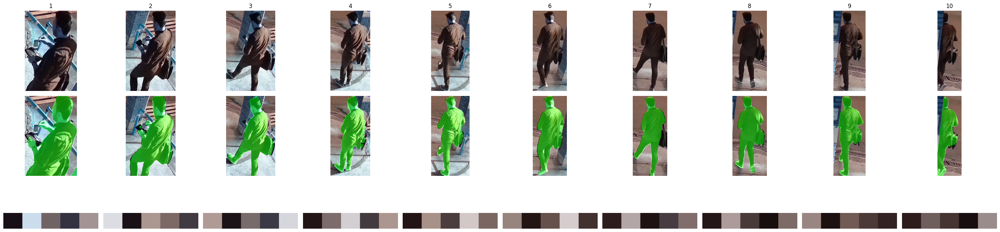

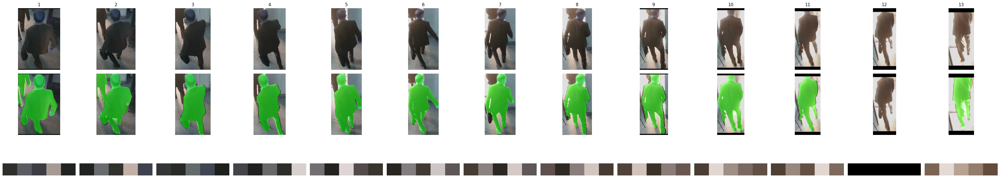

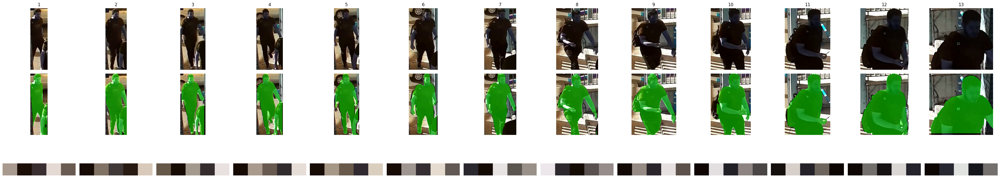

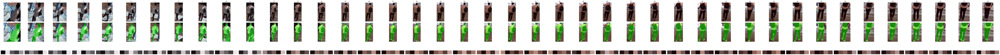

In [13]:
from helper_functions.utils import display_img_mask_palette

display_img_mask_palette(images_list, masks_list)


In [14]:
from helper_functions.utils import extract_features

images = [img.image for img in all_sequences]

features = extract_features(images, model)

AttributeError: 'list' object has no attribute 'image'